In [1]:
#coding:UTF-8
import os
import sys
import numpy as np
import scipy.io as scio
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import seaborn as sns
from scipy import sparse
import shutil
from tqdm.notebook import tqdm

import anndata
import scanpy as sc
from scipy import sparse

sc.logging.print_header()
# sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3

scanpy==1.7.1 anndata==0.7.4 umap==0.4.6 numpy==1.19.2 scipy==1.5.2 pandas==1.1.3 scikit-learn==0.23.2 statsmodels==0.12.0 python-igraph==0.9.1 leidenalg==0.8.3


In [2]:
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
data_root_dir = '/zfssz2/ST_MCHRI/BIGDATA/USER/baiyong/stCluster/data/HumanPilot_spatial.h5ads/scanpy'

h5ad_fname = os.path.join(data_root_dir, '151673.h5ad')

In [8]:
# 
adata = sc.read_h5ad(h5ad_fname)
# QC
# https://scanpy-tutorials.readthedocs.io/en/latest/spatial/basic-analysis.html
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


/zfssz2/ST_MCHRI/BIGDATA/USER/baiyong/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/zfssz2/ST_MCHRI/BIGDATA/USER/baiyong/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/zfssz2/ST_MCHRI/BIGDATA/USER/baiyong/anaconda3/lib/python3.6/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to

<AxesSubplot:xlabel='n_genes_by_counts'>

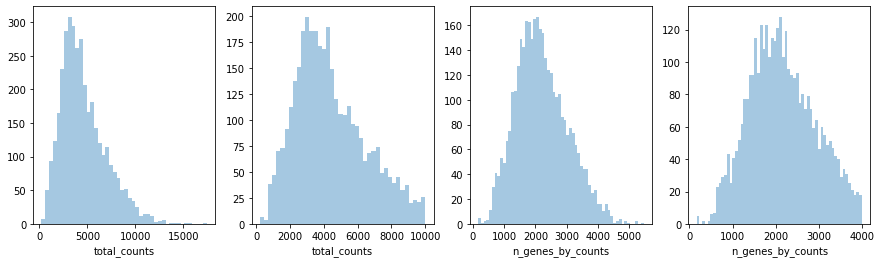

In [9]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.distplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.distplot(adata.obs["total_counts"][adata.obs["total_counts"] < 10000], kde=False, bins=40, ax=axs[1])
sns.distplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.distplot(adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000], kde=False, bins=60, ax=axs[3])


In [10]:
# sc.pp.filter_cells(adata, min_counts=100)
# sc.pp.filter_cells(adata, max_counts=15000)
# adata = adata[adata.obs["pct_counts_mt"] < 50]
# print(f"#cells after MT filter: {adata.n_obs}")
# sc.pp.filter_genes(adata, min_cells=1)

# reference: stLearn
sc.pp.filter_genes(adata, min_cells=1)

filtered out 11696 genes that are detected in less than 1 cells
/zfssz2/ST_MCHRI/BIGDATA/USER/baiyong/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [11]:
adata

AnnData object with n_obs × n_vars = 3639 × 21842
    obs: 'in_tissue', 'array_row', 'array_col', 'celltype', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial'

In [15]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
# sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

/zfssz2/ST_MCHRI/BIGDATA/USER/baiyong/anaconda3/lib/python3.6/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:07)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [12]:
adata

AnnData object with n_obs × n_vars = 3639 × 21842
    obs: 'in_tissue', 'array_row', 'array_col', 'celltype', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial'

In [14]:
# adata=adata[:,adata.var.highly_variable]


sc.pp.pca(adata,n_comps=15)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")


# change the data


computing PCA
    with n_comps=15
    finished (0:00:11)
computing neighbors
    using 'X_pca' with n_pcs = 15
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:16)
running Leiden clustering
    finished: found 15 clusters and added
    'clusters', the cluster labels (adata.obs, categorical) (0:00:01)


In [74]:
adata

AnnData object with n_obs × n_vars = 3639 × 21842
    obs: 'in_tissue', 'array_row', 'array_col', 'celltype', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'clusters'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'spatial', 'pca', 'neighbors', 'umap', 'leiden', 'clusters_colors'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [75]:
adata.obs['clusters']

AAACAAGTATCTCCCA-1    2
AAACAATCTACTAGCA-1    8
AAACACCAATAACTGC-1    9
AAACAGAGCGACTCCT-1    2
AAACAGCTTTCAGAAG-1    0
                     ..
TTGTTTCACATCCAGG-1    9
TTGTTTCATTAGTCTA-1    1
TTGTTTCCATACAACT-1    3
TTGTTTGTATTACACG-1    8
TTGTTTGTGTAAATTC-1    7
Name: clusters, Length: 3639, dtype: category
Categories (15, object): ['0', '1', '2', '3', ..., '11', '12', '13', '14']

/zfssz2/ST_MCHRI/BIGDATA/USER/baiyong/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


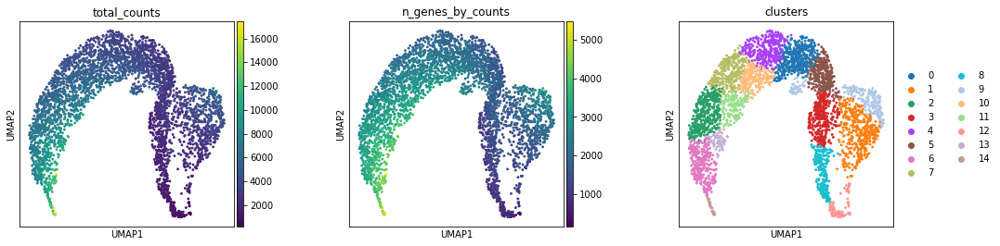

In [15]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "clusters"], wspace=0.4)

/zfssz2/ST_MCHRI/BIGDATA/USER/baiyong/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


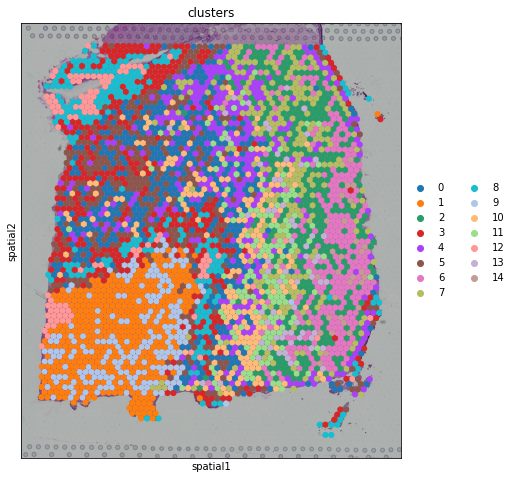

In [124]:
sc.pl.spatial(adata, img_key="hires", color="clusters", size=1.5)

In [16]:
adata

AnnData object with n_obs × n_vars = 3639 × 21842
    obs: 'in_tissue', 'array_row', 'array_col', 'celltype', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'clusters'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'spatial', 'pca', 'neighbors', 'umap', 'leiden', 'clusters_colors'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [17]:
adata.obsm['X_pca']

array([[ 2.24491440e+02,  1.30229721e+01, -7.34675980e+00, ...,
        -5.09392023e-01,  9.91281092e-01, -2.01138096e+01],
       [-2.02456940e+02, -3.13416576e+01,  9.42809963e+00, ...,
        -7.89813936e-01,  4.09445316e-01, -1.24741805e+00],
       [-1.31403534e+02,  9.38679276e+01, -1.89897385e+01, ...,
        -1.24478788e+01, -1.10902472e+01, -3.69665980e+00],
       ...,
       [-1.10053696e+02, -3.22786927e+00, -1.65593472e+01, ...,
        -4.36426210e+00, -3.56364799e+00,  4.81883907e+00],
       [-1.64926041e+02,  4.07545233e+00,  1.67292583e+00, ...,
        -5.98463726e+00, -4.36341190e+00,  2.16850352e+00],
       [ 8.45206757e+01, -1.53696022e+01, -1.03318787e+00, ...,
         5.29828739e+00, -4.73411655e+00, -1.98688492e-01]], dtype=float32)

In [20]:
# from sklearn.preprocessing import normalize,MinMaxScaler

# # adata.obsm['X_pca'] = normalize(adata.obsm['X_pca'])


# adata.obsm['X_pca'] = MinMaxScaler(feature_range=(0,1)).fit_transform(adata.obsm['X_pca'])

In [18]:
adata.obsm['spatial']

array([[ 9791,  8468],
       [ 5769,  2807],
       [ 4068,  9505],
       ...,
       [ 4631,  7831],
       [ 5571, 11193],
       [ 6317,  3291]])

In [23]:
pos = adata.obsm['spatial']
scale_factor = adata.uns['spatial']['151673']['scalefactors']['tissue_hires_scalef']
pos = np.multiply(pos, scale_factor).astype(int)

In [24]:
pos

array([[1468, 1270],
       [ 865,  421],
       [ 610, 1425],
       ...,
       [ 694, 1174],
       [ 835, 1679],
       [ 947,  493]])

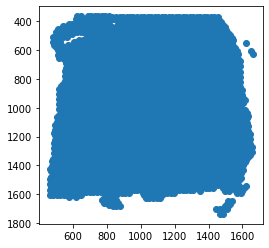

In [25]:
plt.scatter(pos[:,0],pos[:,1])
plt.gca().invert_yaxis()
# plt.grid(None)

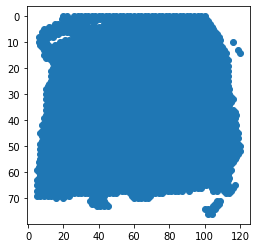

In [26]:
plt.scatter(adata.obs['array_col'],adata.obs['array_row'])
plt.gca().invert_yaxis()

/zfssz2/ST_MCHRI/BIGDATA/USER/baiyong/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


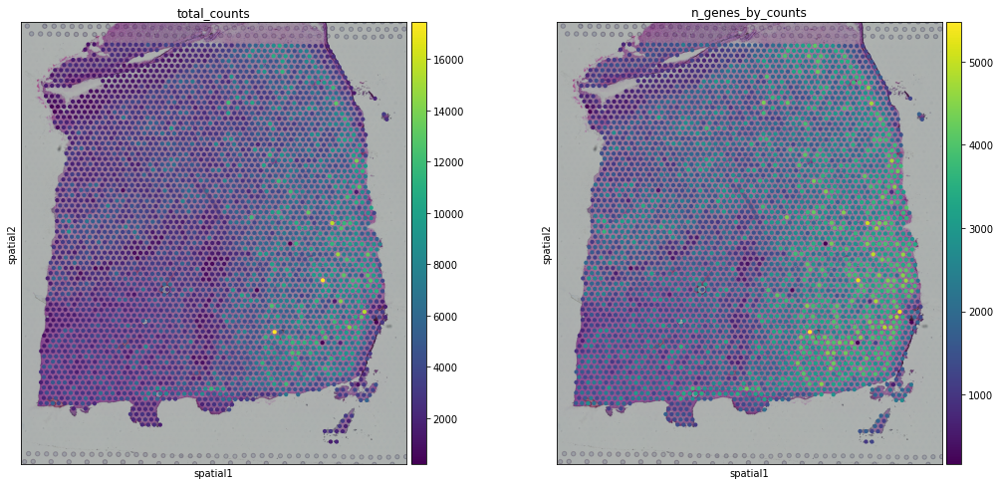

In [27]:
plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts"])

In [133]:


x_pca_scale = sc.pp.scale(adata.obsm['X_pca'])

In [132]:
adata.obsm['X_pca']

array([[ 2.24491440e+02,  1.30229721e+01, -7.34675980e+00, ...,
        -5.09392023e-01,  9.91281092e-01, -2.01138096e+01],
       [-2.02456940e+02, -3.13416576e+01,  9.42809963e+00, ...,
        -7.89813936e-01,  4.09445316e-01, -1.24741805e+00],
       [-1.31403534e+02,  9.38679276e+01, -1.89897385e+01, ...,
        -1.24478788e+01, -1.10902472e+01, -3.69665980e+00],
       ...,
       [-1.10053696e+02, -3.22786927e+00, -1.65593472e+01, ...,
        -4.36426210e+00, -3.56364799e+00,  4.81883907e+00],
       [-1.64926041e+02,  4.07545233e+00,  1.67292583e+00, ...,
        -5.98463726e+00, -4.36341190e+00,  2.16850352e+00],
       [ 8.45206757e+01, -1.53696022e+01, -1.03318787e+00, ...,
         5.29828739e+00, -4.73411655e+00, -1.98688492e-01]], dtype=float32)

In [29]:
adata.obs['array_col']

AAACAAGTATCTCCCA-1    102.0
AAACAATCTACTAGCA-1     43.0
AAACACCAATAACTGC-1     19.0
AAACAGAGCGACTCCT-1     94.0
AAACAGCTTTCAGAAG-1      9.0
                      ...  
TTGTTTCACATCCAGG-1     42.0
TTGTTTCATTAGTCTA-1     30.0
TTGTTTCCATACAACT-1     27.0
TTGTTTGTATTACACG-1     41.0
TTGTTTGTGTAAATTC-1     51.0
Name: array_col, Length: 3639, dtype: float64

In [52]:
adata.obs['array_row']

AAACAAGTATCTCCCA-1    50.0
AAACAATCTACTAGCA-1     3.0
AAACACCAATAACTGC-1    59.0
AAACAGAGCGACTCCT-1    14.0
AAACAGCTTTCAGAAG-1    43.0
                      ... 
TTGTTTCACATCCAGG-1    58.0
TTGTTTCATTAGTCTA-1    60.0
TTGTTTCCATACAACT-1    45.0
TTGTTTGTATTACACG-1    73.0
TTGTTTGTGTAAATTC-1     7.0
Name: array_row, Length: 3639, dtype: float64

In [288]:

col = adata.obs['array_col'].values.astype(int)
row = adata.obs['array_row'].values.astype(int)
poss = zip(col, row)

# mxt = np.zeros((15, pos[:,1].max()+1, pos[:,0].max()+1))

mxt = np.zeros((15,row.max()+1,col.max()+1))

for i,idx in enumerate(poss):
     # mxt[:, idx[1],idx[0]] = adata.obsm['X_pca'][i,:]
     mxt[:, idx[1],idx[0]] = x_pca_scale[i,:]

# for i,idx in enumerate(pos):
#      mxt[:, idx[1], idx[0]] = adata.obsm['X_pca'][i,:]

In [289]:
mxt.shape

(15, 77, 121)

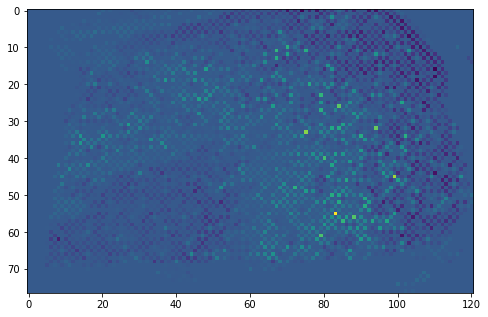

In [290]:
# plt.figure(figsize=[10,10])
plt.imshow(mxt[2])
# plt.grid(None)

In [291]:
#coding:UTF-8
import os
import sys
import numpy as np
import scipy.io as scio
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import seaborn as sns
from scipy import sparse
import shutil
from tqdm.notebook import tqdm

#from __future__ import print_function
import argparse
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
# from torchvision import datasets, transforms
from torch.autograd import Variable
import cv2
import sys
import numpy as np
from skimage import segmentation
import torch.nn.init

use_cuda = torch.cuda.is_available()

# CNN model
class MyNet(nn.Module):
    def __init__(self,input_dim,nChannel,nConv):
        super(MyNet, self).__init__()
        self.nConv = nConv
        self.conv1 = nn.Conv2d(input_dim, nChannel, kernel_size=3, stride=1, padding=1 )
        self.bn1 = nn.BatchNorm2d(nChannel)
        self.conv2 = nn.ModuleList()
        self.bn2 = nn.ModuleList()
        for i in range(nConv-1):
            self.conv2.append( nn.Conv2d(nChannel, nChannel, kernel_size=3, stride=1, padding=1 ) )
            self.bn2.append( nn.BatchNorm2d(nChannel) )
        self.conv3 = nn.Conv2d(nChannel, nChannel, kernel_size=1, stride=1, padding=0 )
        self.bn3 = nn.BatchNorm2d(nChannel)

    def forward(self, x):
        x = self.conv1(x)
        x = F.relu( x )
        x = self.bn1(x)
        for i in range(self.nConv-1):
            x = self.conv2[i](x)
            x = F.relu( x )
            x = self.bn2[i](x)
        x = self.conv3(x)
        x = self.bn3(x)
        return x
print('\n模型放入GPU')
CUDA=torch.cuda.is_available()
device_ids = [0]
# nnet = MyNet(data.size(1),100,2)
# nnet(data.cpu())


模型放入GPU


In [292]:
#读取pca数据
#通过坐标填值
pca=15
#转成模型输入torch格式
data = torch.from_numpy(mxt.astype('float32'))
data = data.cuda(device_ids[0])
data = torch.unsqueeze(data,0)
data.shape

torch.Size([1, 15, 77, 121])

In [331]:
# slic
im = np.transpose(mxt,[1,2,0])
labels = segmentation.slic(im, compactness=100, n_segments=820)
labels = labels.reshape(im.shape[0]*im.shape[1])
u_labels = np.unique(labels)
l_inds = []
for i in range(len(u_labels)):
    l_inds.append( np.where( labels == u_labels[ i ] )[ 0 ] )

/zfssz2/ST_MCHRI/BIGDATA/USER/baiyong/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: skimage.measure.label's indexing starts from 0. In future version it will start from 1. To disable this warning, explicitely set the `start_label` parameter to 1.
  This is separate from the ipykernel package so we can avoid doing imports until


In [332]:
77*121

9317

4355754237622023
254 / 800 : 19 0.004334273748099804
255 / 800 : 19 0.004313013982027769
256 / 800 : 19 0.0042919740080833435
257 / 800 : 19 0.004271131940186024
258 / 800 : 19 0.004250507801771164
259 / 800 : 19 0.004230091813951731
260 / 800 : 19 0.00420988816767931
261 / 800 : 19 0.004189848899841309
262 / 800 : 19 0.004170023836195469
263 / 800 : 19 0.004150368273258209
264 / 800 : 19 0.00413091853260994
265 / 800 : 19 0.004111648071557283
266 / 800 : 19 0.004092569928616285
267 / 800 : 19 0.00407366082072258
268 / 800 : 19 0.004054931923747063
269 / 800 : 19 0.004036393482238054
270 / 800 : 19 0.004018004983663559
271 / 800 : 19 0.003999771550297737
272 / 800 : 19 0.003981731832027435
273 / 800 : 19 0.003963802941143513
274 / 800 : 19 0.003946106415241957
275 / 800 : 19 0.003928563557565212
276 / 800 : 19 0.003911154344677925
277 / 800 : 19 0.0038939211517572403
278 / 800 : 19 0.003876824863255024
279 / 800 : 19 0.003859874326735735
280 / 800 : 19 0.003843084443360567
281 / 800 : 

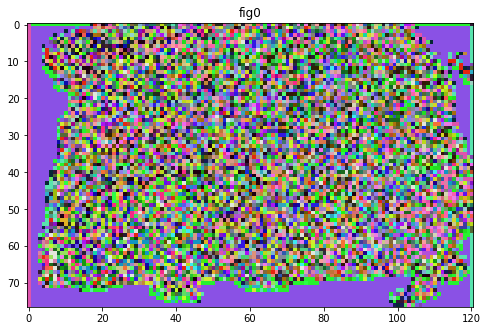

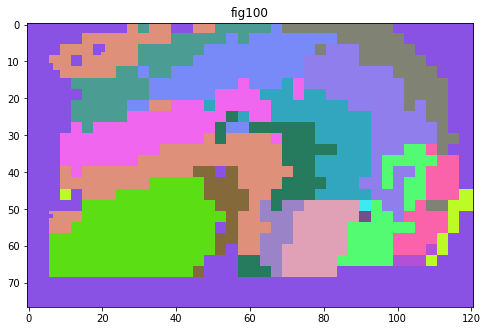

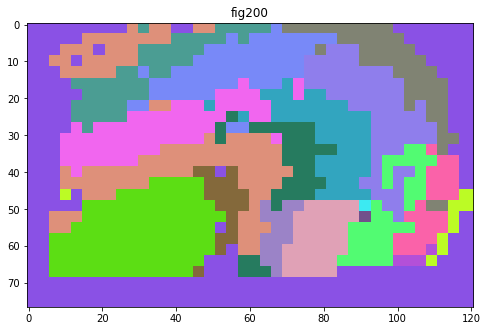

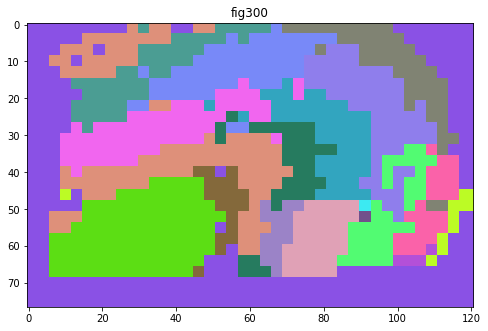

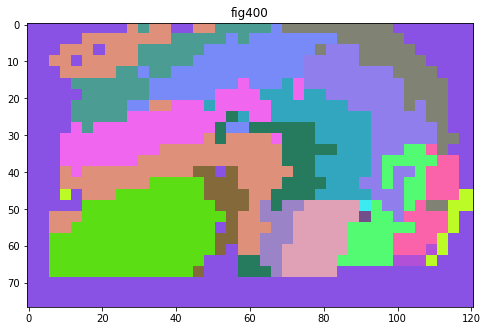

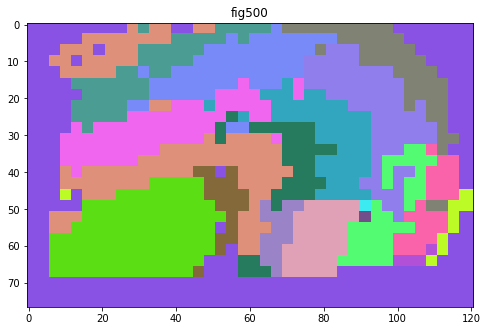

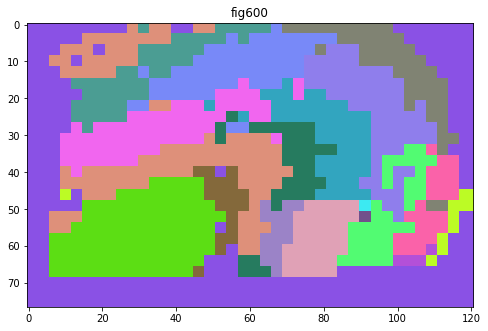

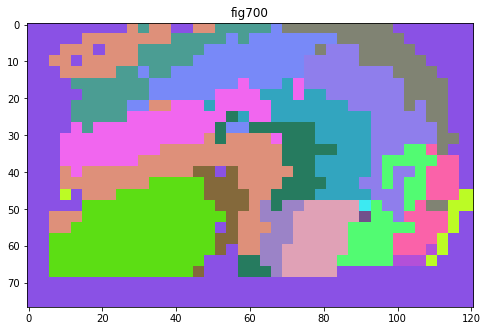

In [333]:
nChannel=100
nConv=2
net=MyNet(input_dim=data.size(1),nChannel=nChannel,nConv=nConv)
model = nn.DataParallel(net,device_ids=device_ids)
model = model.cuda(device=device_ids[0])  # 模型放在主设备
print(model)



# train

maxIter = 800
minLabels = 9

# model = MyNet( data.size(1) )
# if use_cuda:
#     model.cuda()
model.train()
loss_fn = torch.nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.1, momentum=0.9)
label_colours = np.random.randint(255,size=(100,3))

final_target = None
visualize = 1
for batch_idx in range(maxIter):
    # forwarding
    optimizer.zero_grad()
    output = model( data )[ 0 ]
    output = output.permute( 1, 2, 0 ).contiguous().view( -1, nChannel )
    # print(output.shape) 
    ignore, target = torch.max( output, 1 )
    im_target = target.data.cpu().numpy()
    
    final_target = im_target
    
    nLabels = len(np.unique(im_target))
#     if visualize:
    if batch_idx%100==0:
        im_target_rgb = np.array([label_colours[ c % 100 ] for c in im_target])
        im_target_rgb = im_target_rgb.reshape( im[:,:,:3].shape ).astype( np.uint8 )
        plt.figure()
        plt.title('fig{}'.format(batch_idx))
        plt.imshow(im_target_rgb)
#         cv2.imshow( "output", im_target_rgb )
#         cv2.waitKey(10)

    # superpixel refinement
    # TODO: use Torch Variable instead of numpy for faster calculation
    for i in range(len(l_inds)):
        labels_per_sp = im_target[ l_inds[ i ] ]
        u_labels_per_sp = np.unique( labels_per_sp )
        hist = np.zeros( len(u_labels_per_sp) )
        for j in range(len(hist)):
            hist[ j ] = len( np.where( labels_per_sp == u_labels_per_sp[ j ] )[ 0 ] )
        im_target[ l_inds[ i ] ] = u_labels_per_sp[ np.argmax( hist ) ]
    target = torch.from_numpy( im_target )
    target = target.cuda(device_ids[0])
    target = Variable( target )
    loss = loss_fn(output, target)
    loss.backward()
    optimizer.step()

    #print (batch_idx, '/', args.maxIter, ':', nLabels, loss.data[0])
    print (batch_idx, '/', maxIter, ':', nLabels, loss.item())

    if nLabels <= minLabels:
        print ("nLabels", nLabels, "reached minLabels", minLabels, ".")
        break

In [334]:
lab_im = final_target.reshape((row.max()+1,col.max()+1))

In [335]:
len(final_target)

9317

In [336]:
lab_im.shape

(77, 121)

In [337]:
cols_bc = adata.obs['array_col'].copy()

rows_bc = adata.obs['array_row'].copy()


In [338]:
len(cols_bc), len(rows_bc)

(3639, 3639)

In [339]:
x = cols_bc.to_frame().reset_index()
y = rows_bc.to_frame().reset_index()
row_col = y.merge(x, on='index')
row_col['array_row']=row_col['array_row'].astype(int)
row_col['array_col']=row_col['array_col'].astype(int)

In [340]:
row_col

,index,array_row,array_col
0,AAACAAGTATCTCCCA-1,50,102
1,AAACAATCTACTAGCA-1,3,43
2,AAACACCAATAACTGC-1,59,19
3,AAACAGAGCGACTCCT-1,14,94
4,AAACAGCTTTCAGAAG-1,43,9
...,...,...,...
3634,TTGTTTCACATCCAGG-1,58,42
3635,TTGTTTCATTAGTCTA-1,60,30
3636,TTGTTTCCATACAACT-1,45,27
3637,TTGTTTGTATTACACG-1,73,41


In [341]:
pt_label = []
for i,i_row in row_col.iterrows():
    pt_label.append(lab_im[i_row['array_row'],i_row['array_col']])

row_col['clusters']=pd.Categorical(pt_label)
xx = row_col[['index','clusters']].set_index('index')
xx.index.name = None
adata.obs['my_clusters']=xx.squeeze()

/zfssz2/ST_MCHRI/BIGDATA/USER/baiyong/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


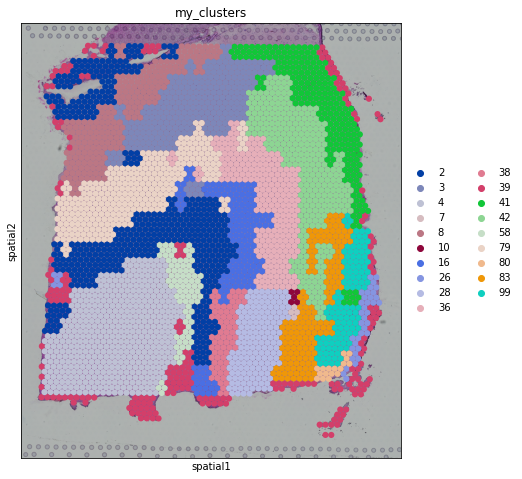

In [342]:
sc.pl.spatial(adata, img_key="hires", color="my_clusters", size=1.5)

In [125]:
adata

AnnData object with n_obs × n_vars = 3639 × 21842
    obs: 'in_tissue', 'array_row', 'array_col', 'celltype', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'clusters', 'my_clusters'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'spatial', 'pca', 'neighbors', 'umap', 'leiden', 'clusters_colors', 'my_clusters_colors'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [126]:
adata.obs['celltype']

AAACAAGTATCTCCCA-1    Layer_3
AAACAATCTACTAGCA-1    Layer_1
AAACACCAATAACTGC-1         WM
AAACAGAGCGACTCCT-1    Layer_3
AAACAGCTTTCAGAAG-1    Layer_5
                       ...   
TTGTTTCACATCCAGG-1         WM
TTGTTTCATTAGTCTA-1         WM
TTGTTTCCATACAACT-1    Layer_6
TTGTTTGTATTACACG-1         WM
TTGTTTGTGTAAATTC-1    Layer_2
Name: celltype, Length: 3639, dtype: category
Categories (8, object): ['Layer_1', 'Layer_2', 'Layer_3', 'Layer_4', 'Layer_5', 'Layer_6', 'WM', 'nan']

/zfssz2/ST_MCHRI/BIGDATA/USER/baiyong/anaconda3/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


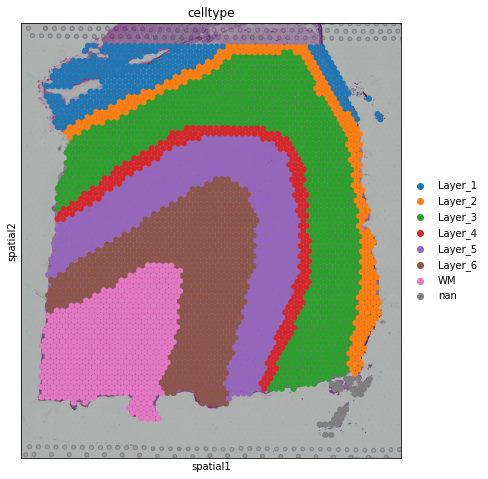

In [127]:
sc.pl.spatial(adata, img_key="hires", color="celltype", size=1.5)